In [849]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

In [850]:
df1 = pd.read_csv("../Web-Scraping-Stats/cleaned_stats_data/player_stats_combined.csv", index_col=False)
df1.rename(columns={'X3P':'ThreeP', 'X3PA': 'ThreeP_Attempted', 'X3P.': 'ThreeP_Percentage', 'FG.': 'FG_Percentage', 'FT.': 'FT_Percentage'}, inplace=True)
df1 = df1.dropna()

df2 = pd.read_csv("../Web-Scraping-Player-Details/cleaned_player_details_data/combined_dataset.csv", index_col=False)
df2 = df2.drop(['Height_Feet', 'Height_Inch'], axis=1)
df2['NBA_Draft_Year'] = pd.to_numeric(df2['NBA_Draft_Year'], errors='coerce')
df2['NBA_Draft_Round'] = pd.to_numeric(df2['NBA_Draft_Round'], errors='coerce')
df2['NBA_Draft_Pick'] = pd.to_numeric(df2['NBA_Draft_Pick'], errors='coerce')
df2 = df2.dropna()

In [851]:
df1['Region'].value_counts()

Region
East    90
West    70
Name: count, dtype: int64

In [852]:
df1['Player_Type'].value_counts()

Player_Type
Reserve    83
Starter    77
Name: count, dtype: int64

In [853]:
df1['Tm'].value_counts()

Tm
LAL    15
CLE    12
OKC    11
DET    11
BOS    11
ORL    10
DAL    10
CHI     8
GSW     7
PHO     7
PHI     7
MIA     5
BKN     5
SAS     5
ATL     4
IND     4
NYK     4
CHA     4
HOU     4
SAC     3
MIL     2
DEN     2
UTA     2
MIN     2
WAS     2
POR     2
TOR     1
Name: count, dtype: int64

In [854]:
df2['Position'].value_counts()

Position
C     137
SF    117
PF    101
SG    100
PG     95
G      73
FC     47
GF     39
F      35
Name: count, dtype: int64

In [855]:
df2['Selection_Type'].value_counts()

Selection_Type
Coaches        416
Fans           290
Replacement     38
Name: count, dtype: int64

In [856]:
df2['Region'].value_counts()

Region
West    377
East    367
Name: count, dtype: int64

In [857]:
df2['Team'].value_counts()

Team
Los Angeles Lakers        58
Boston Celtics            52
Phoenix Suns              43
Detroit Pistons           42
San Antonio Spurs         39
Utah Jazz                 37
Seattle SuperSonics       37
Philadelphia Sixers       34
Houston Rockets           33
Atlanta Hawks             30
Chicago Bulls             26
Dallas Mavericks          25
Cleveland Cavaliers       25
Denver Nuggets            24
New York Knicks           23
Milwaukee Bucks           22
Portland Trail Blazers    21
Orlando Magic             20
New Jersey Nets           19
Washington Wizards        17
Miami Heat                17
Indiana Pacers            16
Sacramento Kings          14
Golden State Warriors     14
Minnesota Timberwolves    13
Toronto Raptors           11
Charlotte Hornets         10
New Orleans Hornets        8
Los Angeles Clippers       7
Kansas City Kings          3
Memphis Grizzlies          2
San Diego Clippers         1
Oklahoma City Thunder      1
Name: count, dtype: int64

In [858]:
df2['Nationality'].value_counts()

Nationality
United States                       660
Nigeria United States                12
United States Jamaica                11
Germany                               9
Democratic Republic of the Congo      8
China                                 7
Canada South Africa                   7
Germany United States                 5
Panama United States                  4
France                                3
Spain                                 3
Serbia Greece                         3
Lithuania                             2
United States Spain                   1
Serbia                                1
Russia                                1
Canada                                1
Argentina                             1
Netherlands                           1
England                               1
Turkey                                1
United States Germany                 1
Dominican Republic United States      1
Name: count, dtype: int64

In [859]:
# Encoding categorical variables
le = LabelEncoder()

df1['Tm_encoded'] = le.fit_transform(df1['Tm'])
df1['Player_Type_encoded'] = le.fit_transform(df1['Player_Type'])
df1['Region_encoded'] = le.fit_transform(df1['Region'])

df2['Team_encoded'] = le.fit_transform(df2['Team'])
df2['Region_encoded'] = le.fit_transform(df2['Region'])
df2['Selection_Type_encoded'] = le.fit_transform(df2['Selection_Type'])
df2['Position_encoded'] = le.fit_transform(df2['Position'])

In [913]:
tm_mapping_df = pd.DataFrame({'Team': df1['Tm'].unique(), 'Encoding': df1['Tm_encoded'].unique()})
tm_mapping_df = tm_mapping_df.sort_values(by='Team')
print(tm_mapping_df)

   Team  Encoding
15  ATL         0
8   BKN         1
6   BOS         2
20  CHA         3
7   CHI         4
14  CLE         5
12  DAL         6
16  DEN         7
5   DET         8
11  GSW         9
21  HOU        10
18  IND        11
0   LAL        12
26  MIA        13
9   MIL        14
23  MIN        15
2   NYK        16
3   OKC        17
19  ORL        18
10  PHI        19
1   PHO        20
13  POR        21
22  SAC        22
4   SAS        23
24  TOR        24
17  UTA        25
25  WAS        26


In [861]:
player_type_mapping_df = pd.DataFrame({'Player Type': df1['Player_Type'].unique(), 'Encoding': df1['Player_Type_encoded'].unique()})
print(player_type_mapping_df)

  Player Type  Encoding
0     Starter         1
1     Reserve         0


In [862]:
region_mapping_df = pd.DataFrame({'Region': df1['Region'].unique(), 'Encoding': df1['Region_encoded'].unique()})
print(region_mapping_df)

  Region  Encoding
0   West         1
1   East         0


In [912]:
team_mapping_df = pd.DataFrame({'Team': df2['Team'].unique(), 'Encoding': df2['Team_encoded'].unique()})
team_mapping_df = team_mapping_df.sort_values(by='Team')
print(team_mapping_df)

                      Team  Encoding
2            Atlanta Hawks         0
0           Boston Celtics         1
25       Charlotte Hornets         2
14           Chicago Bulls         3
15     Cleveland Cavaliers         4
20        Dallas Mavericks         5
18          Denver Nuggets         6
16         Detroit Pistons         7
19   Golden State Warriors         8
21         Houston Rockets         9
23          Indiana Pacers        10
7        Kansas City Kings        11
22    Los Angeles Clippers        12
6       Los Angeles Lakers        13
31       Memphis Grizzlies        14
27              Miami Heat        15
12         Milwaukee Bucks        16
28  Minnesota Timberwolves        17
17         New Jersey Nets        18
30     New Orleans Hornets        19
1          New York Knicks        20
32   Oklahoma City Thunder        21
26           Orlando Magic        22
3      Philadelphia Sixers        23
9             Phoenix Suns        24
13  Portland Trail Blazers        25
2

In [911]:
region_mapping_df2 = pd.DataFrame({'Region': df2['Region'].unique(), 'Encoding': df2['Region_encoded'].unique()})
print(region_mapping_df2)

  Region  Encoding
0   East         0
1   West         1


In [865]:
pos_mapping_df = pd.DataFrame({'Position': df2['Position'].unique(), 'Encoding': df2['Position_encoded'].unique()})
pos_mapping_df = pos_mapping_df.sort_values(by='Position')
print(pos_mapping_df)

  Position  Encoding
2        C         0
7        F         1
3       FC         2
5        G         3
4       GF         4
6       PF         5
0       PG         6
1       SF         7
8       SG         8


In [866]:
selection_type_mapping_df = pd.DataFrame({'Selection Type': df2['Selection_Type'].unique(), 'Encoding': df2['Selection_Type_encoded'].unique()})
print(selection_type_mapping_df)

  Selection Type  Encoding
0        Coaches         0
1           Fans         1
2    Replacement         2


Accuracy: 0.72
Classification Report:
               precision    recall  f1-score   support

        East       0.80      0.67      0.73        18
        West       0.65      0.79      0.71        14

    accuracy                           0.72        32
   macro avg       0.72      0.73      0.72        32
weighted avg       0.73      0.72      0.72        32



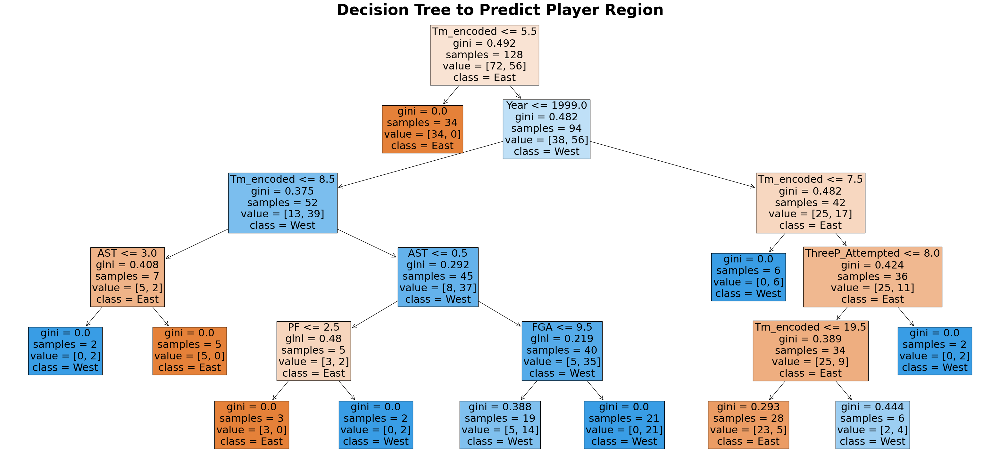

In [867]:
# Decision tree for REGION in Player Stats data
features = df1.select_dtypes(include=np.number).drop(['Region_encoded'], axis=1)
target = df1['Region']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

decision_tree = DecisionTreeClassifier(max_depth=5,random_state=42)
decision_tree.fit(X_train, y_train)

y_pred = decision_tree.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_rep)

plt.figure(figsize=(40, 18))
plot_tree(decision_tree, filled=True, feature_names=features.columns, class_names=decision_tree.classes_, fontsize=23)
plt.title("Decision Tree to Predict Player Region", fontsize=34, weight='bold')
plt.savefig("../mysite/DT-Stats-Region.png")
plt.show()

Accuracy: 0.62
Classification Report:
               precision    recall  f1-score   support

        East       0.69      0.61      0.65        18
        West       0.56      0.64      0.60        14

    accuracy                           0.62        32
   macro avg       0.62      0.63      0.62        32
weighted avg       0.63      0.62      0.63        32



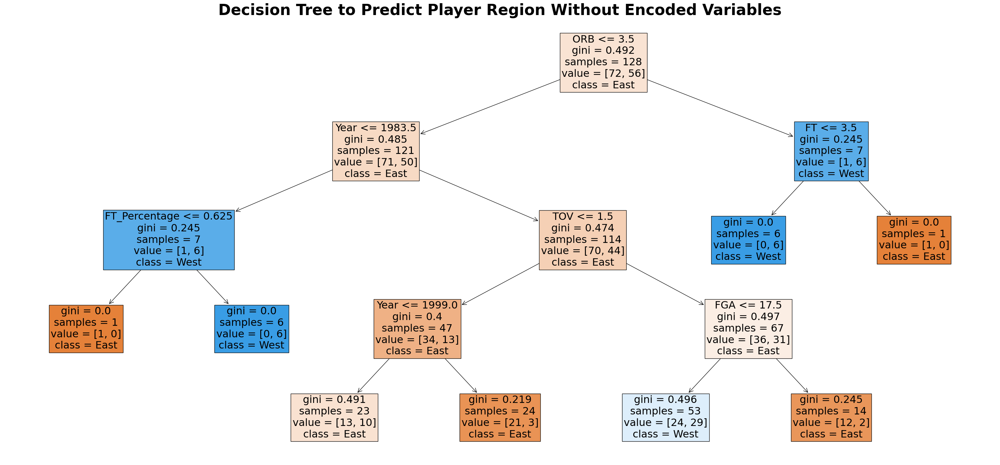

In [868]:
# Decision tree for REGION in Player Stats data
features = df1.select_dtypes(include=np.number).drop(['Region_encoded', 'Tm_encoded', 'Player_Type_encoded'], axis=1)
target = df1['Region']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

decision_tree = DecisionTreeClassifier(max_depth=4,random_state=42)
decision_tree.fit(X_train, y_train)

y_pred = decision_tree.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_rep)

plt.figure(figsize=(40, 18))
plot_tree(decision_tree, filled=True, feature_names=features.columns, class_names=decision_tree.classes_, fontsize=23)
plt.title("Decision Tree to Predict Player Region Without Encoded Variables", fontsize=34, weight='bold')
plt.show()

Accuracy: 0.66
Classification Report:
               precision    recall  f1-score   support

        East       0.67      0.78      0.72        18
        West       0.64      0.50      0.56        14

    accuracy                           0.66        32
   macro avg       0.65      0.64      0.64        32
weighted avg       0.65      0.66      0.65        32



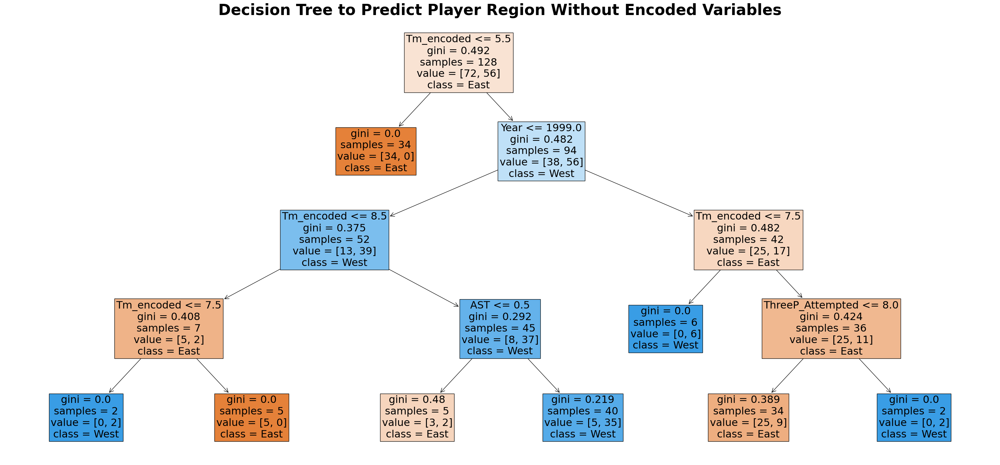

In [869]:
# Decision tree for REGION in Player Stats data
features = df1.select_dtypes(include='int').drop(['Region_encoded'], axis=1)
target = df1['Region']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

decision_tree = DecisionTreeClassifier(max_depth=4,random_state=42)
decision_tree.fit(X_train, y_train)

y_pred = decision_tree.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_rep)

plt.figure(figsize=(40, 18))
plot_tree(decision_tree, filled=True, feature_names=features.columns, class_names=decision_tree.classes_, fontsize=23)
plt.title("Decision Tree to Predict Player Region Without Encoded Variables", fontsize=34, weight='bold')
plt.show()

Accuracy: 0.62
Classification Report:
               precision    recall  f1-score   support

     Reserve       0.53      0.62      0.57        13
     Starter       0.71      0.63      0.67        19

    accuracy                           0.62        32
   macro avg       0.62      0.62      0.62        32
weighted avg       0.64      0.62      0.63        32



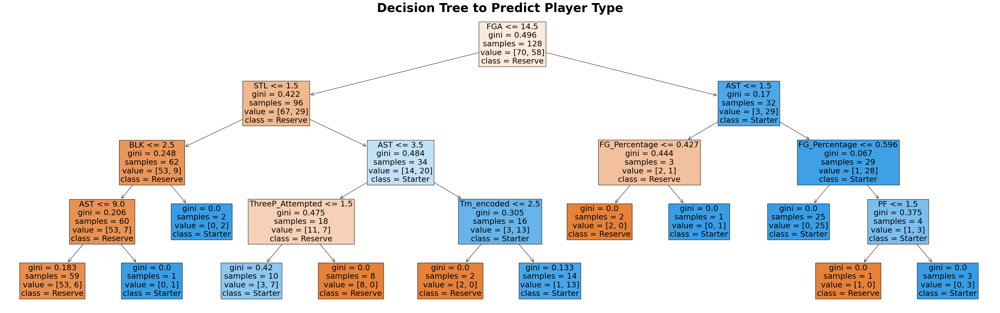

In [870]:
# Decision Tree for PLAYER TYPE in Player Stats
features = df1.select_dtypes(include=np.number).drop(['Player_Type_encoded'], axis=1)
target = df1['Player_Type']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

decision_tree = DecisionTreeClassifier(max_depth=4,random_state=42)
decision_tree.fit(X_train, y_train)

y_pred = decision_tree.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_rep)

plt.figure(figsize=(50, 15))
plot_tree(decision_tree, filled=True, feature_names=features.columns, class_names=decision_tree.classes_, fontsize=22)
plt.title("Decision Tree to Predict Player Type", fontsize=34, weight='bold')
#plt.savefig("../mysite/DT-Stats-PlayerType.png")
plt.show()

Accuracy: 0.66
Classification Report:
               precision    recall  f1-score   support

     Reserve       0.56      0.69      0.62        13
     Starter       0.75      0.63      0.69        19

    accuracy                           0.66        32
   macro avg       0.66      0.66      0.65        32
weighted avg       0.67      0.66      0.66        32



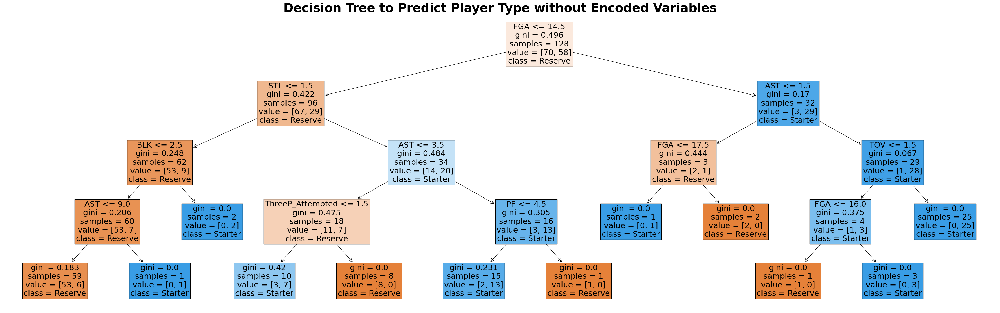

In [871]:
# Decision Tree for PLAYER TYPE in Player Stats
features = df1.select_dtypes(include=np.number).drop(['Region_encoded', 'Tm_encoded', 'Player_Type_encoded'], axis=1)
target = df1['Player_Type']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

decision_tree = DecisionTreeClassifier(max_depth=4,random_state=42)
decision_tree.fit(X_train, y_train)

y_pred = decision_tree.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:\n", classification_rep)

plt.figure(figsize=(50, 15))
plot_tree(decision_tree, filled=True, feature_names=features.columns, class_names=decision_tree.classes_, fontsize=22)
plt.title("Decision Tree to Predict Player Type without Encoded Variables", fontsize=34, weight='bold')
plt.savefig("../mysite/DT-Stats-PlayerType.png")
plt.show()

/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 0.58
Classification Report:
               precision    recall  f1-score   support

           C       0.88      1.00      0.94        23
           F       0.00      0.00      0.00         9
          FC       0.38      0.75      0.50         4
           G       0.75      0.46      0.57        13
          GF       0.00      0.00      0.00        12
          PF       0.82      0.58      0.68        24
          PG       0.58      0.75      0.65        20
          SF       0.41      1.00      0.58        26
          SG       0.00      0.00      0.00        18

    accuracy                           0.58       149
   macro avg       0.42      0.50      0.44       149
weighted avg       0.49      0.58      0.51       149



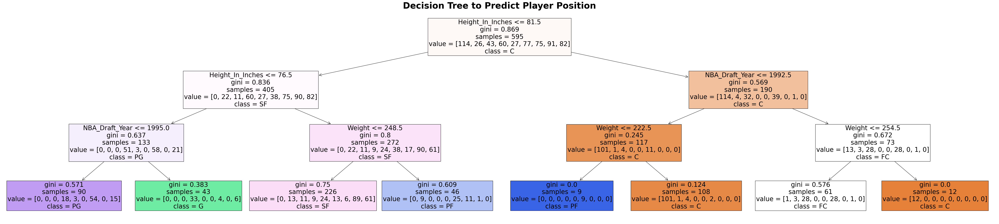

In [872]:
# Decision tree for POSITION in Player Details data
features2 = df2.select_dtypes(include=np.number).drop(['Position_encoded'], axis=1)
target2 = df2['Position']

X_train2, X_test2, y_train2, y_test2 = train_test_split(features2, target2, test_size=0.2, random_state=42)

decision_tree2 = DecisionTreeClassifier(max_depth=3, random_state=42)
decision_tree2.fit(X_train2, y_train2)

y_pred2 = decision_tree2.predict(X_test2)

accuracy2 = accuracy_score(y_test2, y_pred2)
classification_rep2 = classification_report(y_test2, y_pred2)

print(f"Accuracy: {accuracy2:.2f}")
print("Classification Report:\n", classification_rep2)

plt.figure(figsize=(70, 15))
plot_tree(decision_tree2, filled=True, feature_names=features2.columns, class_names=decision_tree2.classes_, fontsize=25)
plt.title("Decision Tree to Predict Player Position", fontsize=34, weight='bold')
plt.savefig("../mysite/DT-Stats-Position.png")
plt.show()

/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 0.70
Classification Report:
               precision    recall  f1-score   support

     Coaches       0.75      0.82      0.78        96
        Fans       0.58      0.52      0.55        48
 Replacement       0.00      0.00      0.00         5

    accuracy                           0.70       149
   macro avg       0.44      0.45      0.44       149
weighted avg       0.67      0.70      0.68       149



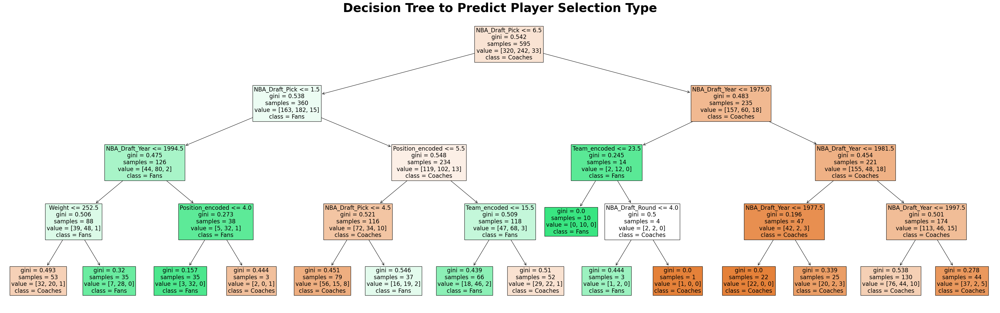

In [873]:
# Decision tree for SELECTION TYPE in Player Details data
features2 = df2.select_dtypes(include=np.number).drop('Selection_Type_encoded', axis=1)
target2 = df2['Selection_Type']

X_train2, X_test2, y_train2, y_test2 = train_test_split(features2, target2, test_size=0.2, random_state=42)

decision_tree2 = DecisionTreeClassifier(max_depth=4, random_state=42)
decision_tree2.fit(X_train2, y_train2)

y_pred2 = decision_tree2.predict(X_test2)

accuracy2 = accuracy_score(y_test2, y_pred2)
classification_rep2 = classification_report(y_test2, y_pred2)

print(f"Accuracy: {accuracy2:.2f}")
print("Classification Report:\n", classification_rep2)

plt.figure(figsize=(50, 15))
plot_tree(decision_tree2, filled=True, feature_names=features2.columns, class_names=decision_tree2.classes_, fontsize=16)
plt.title("Decision Tree to Predict Player Selection Type", fontsize=34, weight='bold')
plt.savefig("../mysite/DT-Details-SelectionType.png")
plt.show()

/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 0.68
Classification Report:
               precision    recall  f1-score   support

     Coaches       0.77      0.73      0.75        96
        Fans       0.55      0.67      0.60        48
 Replacement       0.00      0.00      0.00         5

    accuracy                           0.68       149
   macro avg       0.44      0.47      0.45       149
weighted avg       0.67      0.68      0.68       149



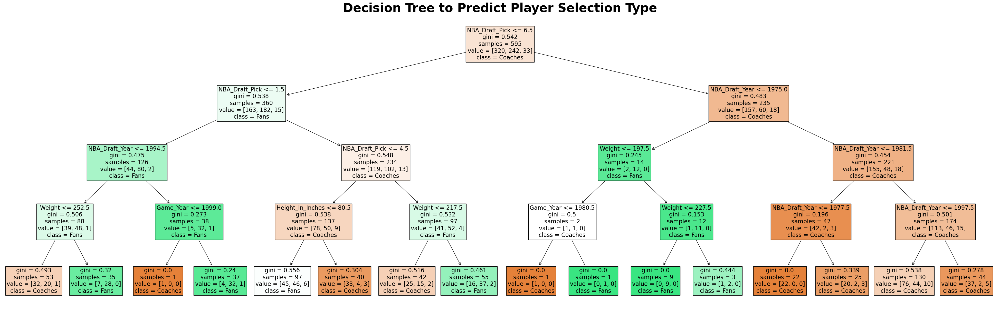

In [874]:
# Decision tree for SELECTION TYPE in Player Details data
features2 = df2.select_dtypes(include=np.number).drop(['Region_encoded', 'Team_encoded', 'Selection_Type_encoded', 'Position_encoded'], axis=1)
target2 = df2['Selection_Type']

X_train2, X_test2, y_train2, y_test2 = train_test_split(features2, target2, test_size=0.2, random_state=42)

decision_tree2 = DecisionTreeClassifier(max_depth=4, random_state=42)
decision_tree2.fit(X_train2, y_train2)

y_pred2 = decision_tree2.predict(X_test2)

accuracy2 = accuracy_score(y_test2, y_pred2)
classification_rep2 = classification_report(y_test2, y_pred2)

print(f"Accuracy: {accuracy2:.2f}")
print("Classification Report:\n", classification_rep2)

plt.figure(figsize=(50, 15))
plot_tree(decision_tree2, filled=True, feature_names=features2.columns, class_names=decision_tree2.classes_, fontsize=16)
plt.title("Decision Tree to Predict Player Selection Type", fontsize=34, weight='bold')
#plt.savefig("../mysite/DT-Details-SelectionType.png")
plt.show()

Accuracy: 0.91
Classification Report:
               precision    recall  f1-score   support

        East       0.97      0.84      0.90        76
        West       0.86      0.97      0.91        73

    accuracy                           0.91       149
   macro avg       0.91      0.91      0.91       149
weighted avg       0.91      0.91      0.91       149



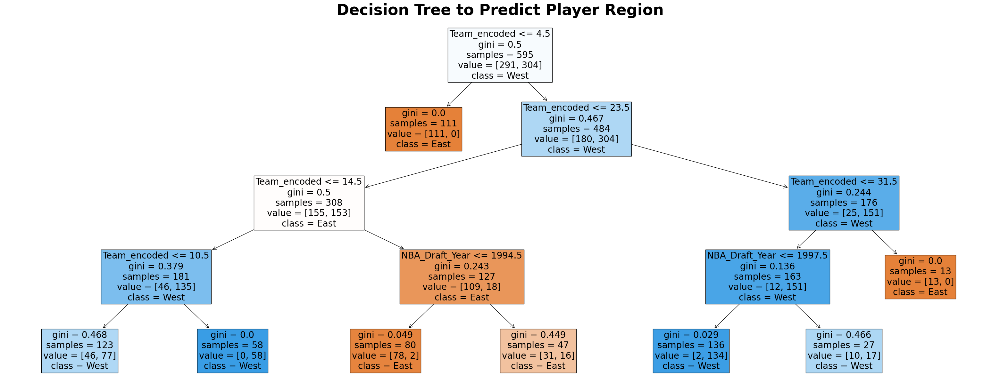

In [875]:
# Decision tree for REGION in Player Details data
features2 = df2.select_dtypes(include=np.number).drop('Region_encoded', axis=1)
target2 = df2['Region']

X_train2, X_test2, y_train2, y_test2 = train_test_split(features2, target2, test_size=0.2, random_state=42)

decision_tree2 = DecisionTreeClassifier(max_depth=4, random_state=42)
decision_tree2.fit(X_train2, y_train2)

y_pred2 = decision_tree2.predict(X_test2)

accuracy2 = accuracy_score(y_test2, y_pred2)
classification_rep2 = classification_report(y_test2, y_pred2)

print(f"Accuracy: {accuracy2:.2f}")
print("Classification Report:\n", classification_rep2)

plt.figure(figsize=(40, 15))
plot_tree(decision_tree2, filled=True, feature_names=features2.columns, class_names=decision_tree2.classes_, fontsize=20)
plt.title("Decision Tree to Predict Player Region", fontsize=34, weight='bold')
plt.savefig("../mysite/DT-Details-Region.png")
plt.show()

Accuracy: 0.65
Classification Report:
               precision    recall  f1-score   support

        East       0.68      0.61      0.64        76
        West       0.63      0.70      0.66        73

    accuracy                           0.65       149
   macro avg       0.65      0.65      0.65       149
weighted avg       0.65      0.65      0.65       149



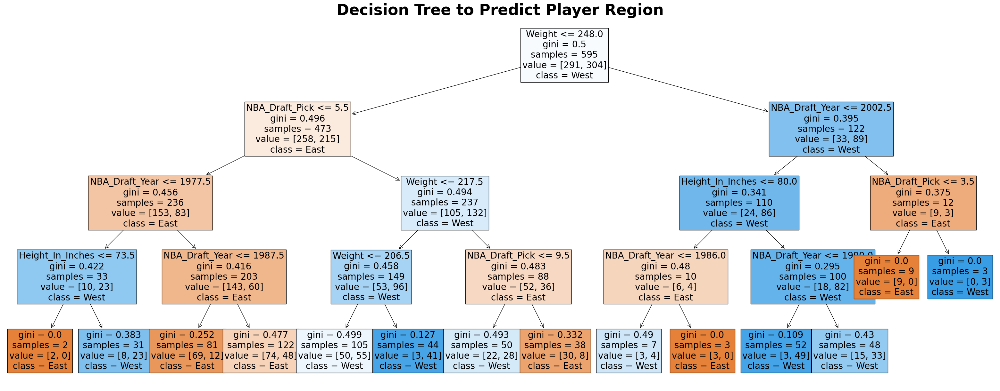

In [876]:
# Decision tree for REGION in Player Details data
features2 = df2.select_dtypes(include=np.number).drop(['Region_encoded', 'Team_encoded', 'Selection_Type_encoded', 'Position_encoded'], axis=1)
target2 = df2['Region']

X_train2, X_test2, y_train2, y_test2 = train_test_split(features2, target2, test_size=0.2, random_state=42)

decision_tree2 = DecisionTreeClassifier(max_depth=4, random_state=42)
decision_tree2.fit(X_train2, y_train2)

y_pred2 = decision_tree2.predict(X_test2)

accuracy2 = accuracy_score(y_test2, y_pred2)
classification_rep2 = classification_report(y_test2, y_pred2)

print(f"Accuracy: {accuracy2:.2f}")
print("Classification Report:\n", classification_rep2)

plt.figure(figsize=(40, 15))
plot_tree(decision_tree2, filled=True, feature_names=features2.columns, class_names=decision_tree2.classes_, fontsize=20)
plt.title("Decision Tree to Predict Player Region", fontsize=34, weight='bold')
#plt.savefig("../mysite/DT-Details-Region.png")
plt.show()

Accuracy:  0.62
Classification Report:
              precision    recall  f1-score   support

        East       0.65      0.72      0.68        18
        West       0.58      0.50      0.54        14

    accuracy                           0.62        32
   macro avg       0.62      0.61      0.61        32
weighted avg       0.62      0.62      0.62        32



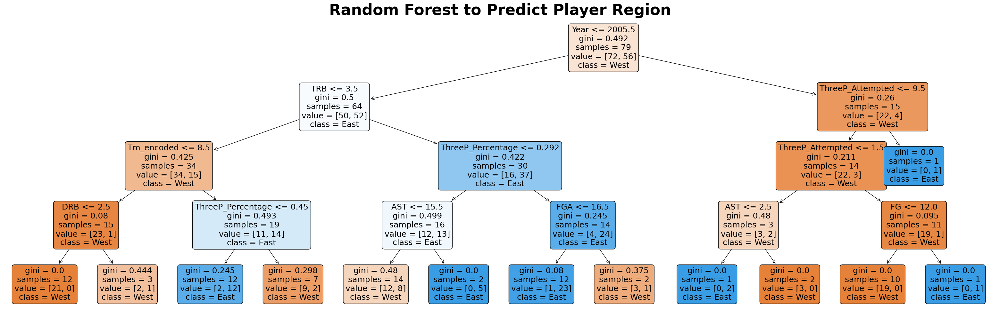

In [877]:
# Random Forest for REGION in Player Stats data
X = df1.select_dtypes(include=np.number).drop(['Region_encoded'], axis=1)
y = df1['Region']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=4)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(40,12))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=18)
plt.title("Random Forest to Predict Player Region", fontsize=34, weight='bold')
plt.savefig("../mysite/RF-Stats-Region.png")
plt.show()

Accuracy:  0.53
Classification Report:
              precision    recall  f1-score   support

        East       0.57      0.72      0.63        18
        West       0.44      0.29      0.35        14

    accuracy                           0.53        32
   macro avg       0.50      0.50      0.49        32
weighted avg       0.51      0.53      0.51        32



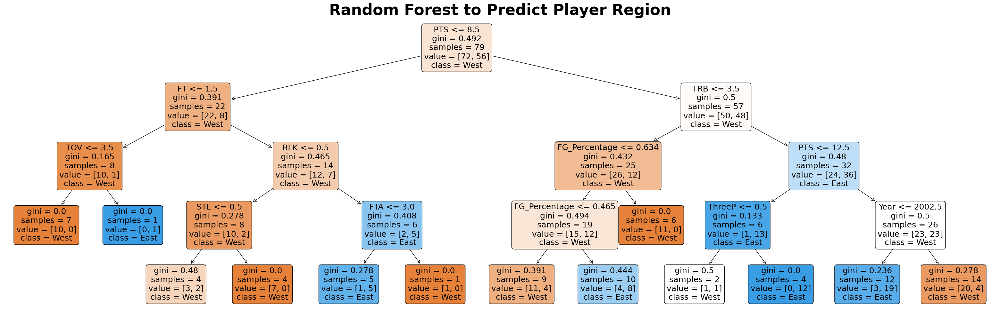

In [878]:
# Random Forest for REGION in Player Stats data
X = df1.select_dtypes(include=np.number).drop(['Region_encoded', 'Tm_encoded', 'Player_Type_encoded'], axis=1)
y = df1['Region']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=4)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(40,12))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=18)
plt.title("Random Forest to Predict Player Region", fontsize=34, weight='bold')
#plt.savefig("../mysite/RF-Stats-Region.png")
plt.show()

Accuracy:  0.72
Classification Report:
              precision    recall  f1-score   support

     Reserve       0.61      0.85      0.71        13
     Starter       0.86      0.63      0.73        19

    accuracy                           0.72        32
   macro avg       0.73      0.74      0.72        32
weighted avg       0.76      0.72      0.72        32



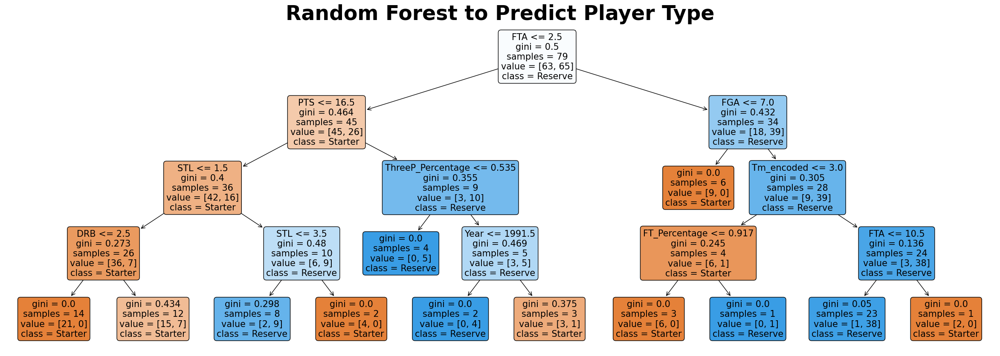

In [879]:
# Random Forest for PLAYER TYPE in Player Stats data
X = df1.select_dtypes(include=np.number).drop(['Player_Type_encoded'], axis=1)
y = df1['Player_Type']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=4)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(30,10))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=15)
plt.title("Random Forest to Predict Player Type", fontsize=34, weight='bold')
plt.savefig("../mysite/RF-Stats-PlayerType.png")
plt.show()

Accuracy:  0.66
Classification Report:
              precision    recall  f1-score   support

     Reserve       0.56      0.77      0.65        13
     Starter       0.79      0.58      0.67        19

    accuracy                           0.66        32
   macro avg       0.67      0.67      0.66        32
weighted avg       0.69      0.66      0.66        32



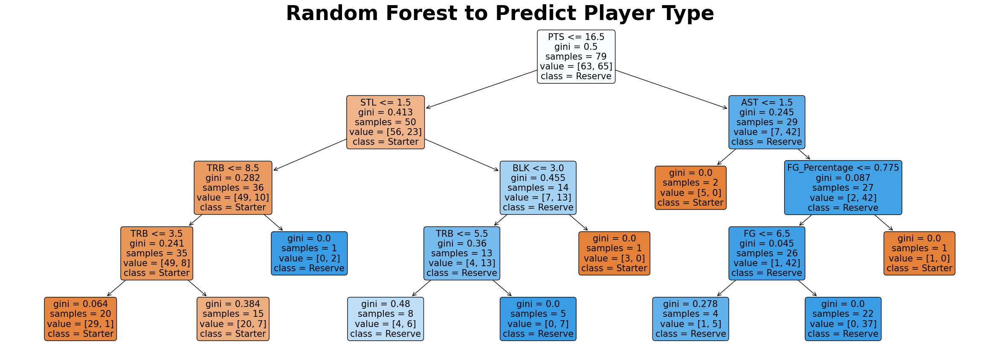

In [880]:
# Random Forest for PLAYER TYPE in Player Stats data
X = df1.select_dtypes(include=np.number).drop(['Region_encoded', 'Tm_encoded', 'Player_Type_encoded'], axis=1)
y = df1['Player_Type']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=4)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(30,10))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=15)
plt.title("Random Forest to Predict Player Type", fontsize=34, weight='bold')
#plt.savefig("../mysite/RF-Stats-PlayerType.png")
plt.show()

Accuracy:  0.62
Classification Report:
              precision    recall  f1-score   support

           C       0.68      1.00      0.81        23
           F       0.00      0.00      0.00         9
          FC       0.67      0.50      0.57         4
           G       0.73      0.62      0.67        13
          GF       0.00      0.00      0.00        12
          PF       0.64      0.58      0.61        24
          PG       0.64      0.70      0.67        20
          SF       0.55      0.69      0.61        26
          SG       0.54      0.72      0.62        18

    accuracy                           0.62       149
   macro avg       0.49      0.53      0.51       149
weighted avg       0.53      0.62      0.57       149



/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


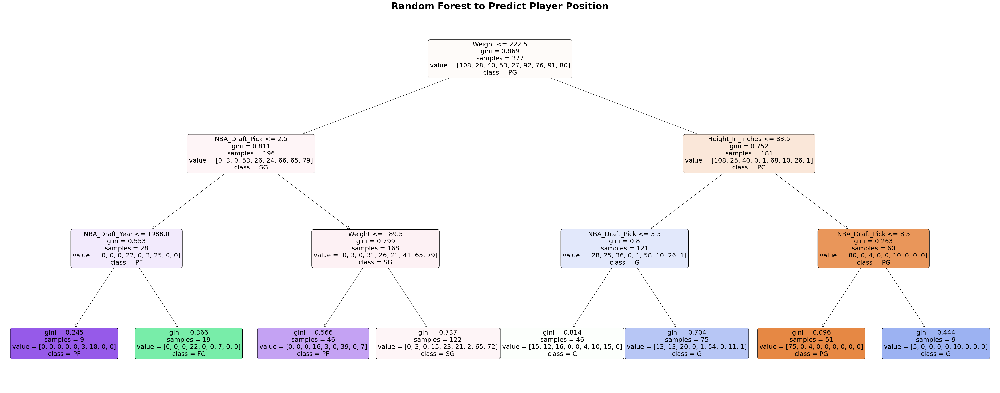

In [910]:
# Random Forest for POSITION in Player Details data
X = df2.select_dtypes(include=np.number).drop(['Position_encoded'], axis=1)
y = df2['Position']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=41, max_depth=3)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(65,25))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=23)
plt.title("Random Forest to Predict Player Position", fontsize=34, weight='bold')
plt.savefig("../mysite/RF-Details-Position.png")
plt.show()

Accuracy:  0.70
Classification Report:
              precision    recall  f1-score   support

           C       0.70      0.96      0.81        27
           F       0.89      0.52      0.65        33
           G       0.56      0.90      0.69        31
          PG       0.86      0.30      0.44        20
          SF       0.78      0.74      0.76        38

    accuracy                           0.70       149
   macro avg       0.76      0.68      0.67       149
weighted avg       0.76      0.70      0.69       149



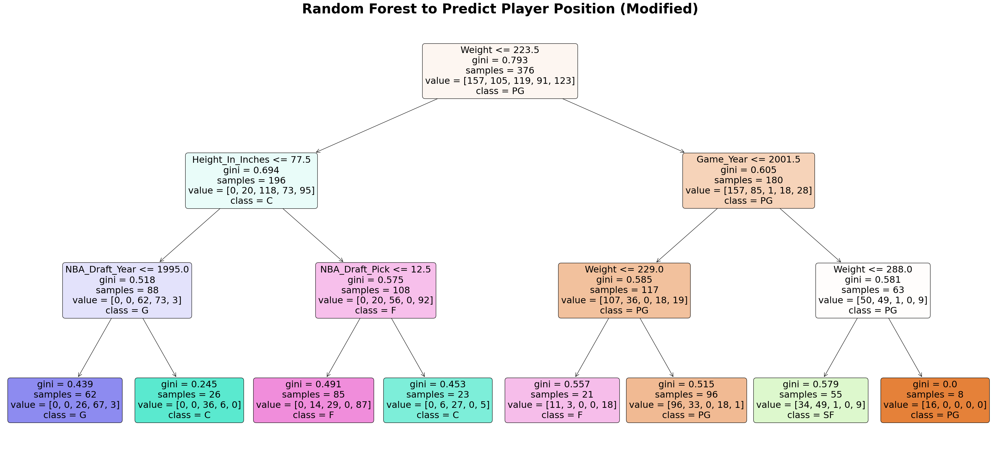

In [847]:
# Random Forest for MODIFIED POSITION in Player Details data
df2['Modified_Position'] = df2['Position'].replace({'SG': 'G', 'GF': 'SF', 'PF': 'F', 'FC': 'C'})
final_position_mapping = {'PG': 1, 'G': 2, 'SF': 3, 'F': 4, 'C': 5}
df2['Final_Position_encoded'] = df2['Modified_Position'].map(final_position_mapping)

X = df2.select_dtypes(include=np.number).drop(['Final_Position_encoded', 'Position_encoded'], axis=1)
y = df2['Modified_Position']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=35, max_depth=3)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(45,20))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=23)
plt.title("Random Forest to Predict Player Position (Modified)", fontsize=34, weight='bold')
plt.savefig("../mysite/RF-Details-Mod-Position.png")
plt.show()

In [914]:
df2.select_dtypes(include=np.number)

,Weight,Game_Year,Height_In_Inches,NBA_Draft_Year,NBA_Draft_Round,NBA_Draft_Pick,Team_encoded,Region_encoded,Selection_Type_encoded,Position_encoded
0,150,1980,73,1970.0,2.0,2.0,1,0,0,6
1,220,1980,81,1978.0,1.0,6.0,1,0,0,7
2,245,1980,85,1979.0,1.0,3.0,20,0,0,0
3,230,1980,81,1970.0,1.0,4.0,1,0,0,2
4,205,1980,78,1974.0,2.0,7.0,0,0,1,4
...,...,...,...,...,...,...,...,...,...,...
756,235,2010,79,1998.0,1.0,10.0,1,0,0,7
757,180,2010,73,2006.0,1.0,21.0,1,0,0,6
758,200,2010,75,2008.0,1.0,1.0,3,0,0,6
759,220,2010,76,2003.0,1.0,5.0,15,0,1,8


Accuracy:  0.64
Classification Report:
              precision    recall  f1-score   support

           C       0.74      1.00      0.85        23
           F       0.00      0.00      0.00         9
          FC       0.67      0.50      0.57         4
           G       0.80      0.62      0.70        13
          GF       0.00      0.00      0.00        12
          PF       0.67      0.75      0.71        24
          PG       0.58      0.75      0.65        20
          SF       0.57      0.62      0.59        26
          SG       0.54      0.72      0.62        18

    accuracy                           0.64       149
   macro avg       0.51      0.55      0.52       149
weighted avg       0.55      0.64      0.59       149



/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


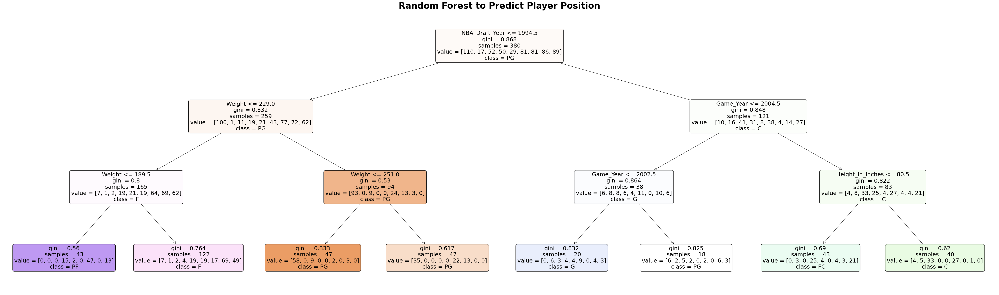

In [885]:
# Random Forest for POSITION in Player Details data
X = df2.select_dtypes(include=np.number).drop(['Region_encoded', 'Team_encoded', 'Selection_Type_encoded', 'Position_encoded'], axis=1)
y = df2['Position']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=3)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(70,20))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=22)
plt.title("Random Forest to Predict Player Position", fontsize=34, weight='bold')
#plt.savefig("../mysite/RF-Details-Position.png")
plt.show()

Accuracy:  0.74
Classification Report:
              precision    recall  f1-score   support

     Coaches       0.74      0.93      0.82        96
        Fans       0.72      0.44      0.55        48
 Replacement       0.00      0.00      0.00         5

    accuracy                           0.74       149
   macro avg       0.49      0.45      0.46       149
weighted avg       0.71      0.74      0.71       149



/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


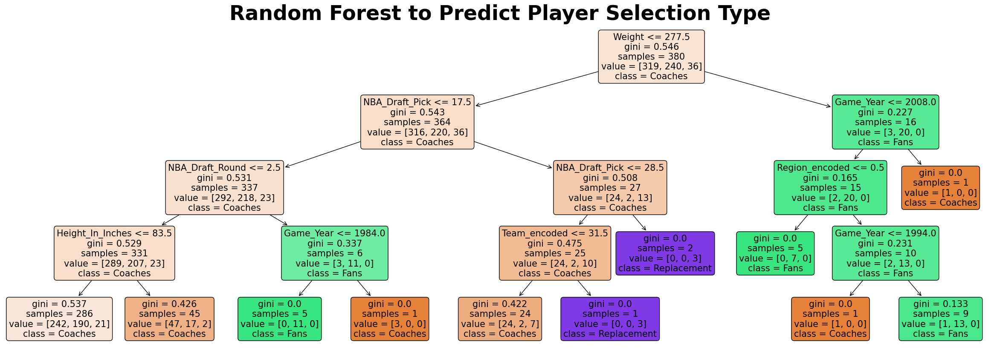

In [894]:
# Random Forest for SELECTION TYPE in Player Details data
X = df2.select_dtypes(include=np.number).drop(['Selection_Type_encoded'], axis=1)
y = df2['Selection_Type']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=4)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(30,10))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=15)
plt.title("Random Forest to Predict Player Selection Type", fontsize=34, weight='bold')
plt.savefig("../mysite/RF-Details-SelectionType.png")
plt.show()

Accuracy:  0.73
Classification Report:
              precision    recall  f1-score   support

     Coaches       0.74      0.91      0.82        96
        Fans       0.69      0.46      0.55        48
 Replacement       0.00      0.00      0.00         5

    accuracy                           0.73       149
   macro avg       0.48      0.45      0.46       149
weighted avg       0.70      0.73      0.70       149



/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tori/anaconda3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


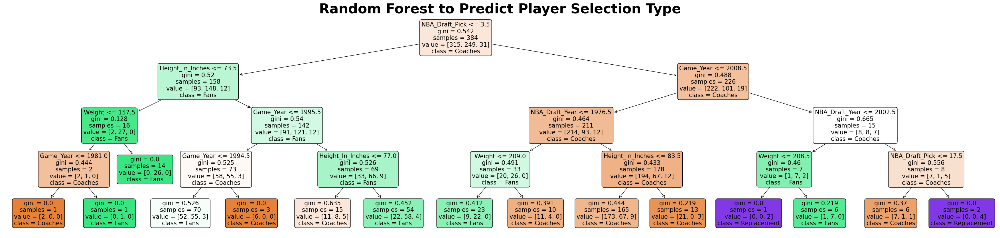

In [893]:
# Random Forest for SELECTION TYPE in Player Details data
X = df2.select_dtypes(include=np.number).drop(['Region_encoded', 'Team_encoded', 'Selection_Type_encoded', 'Position_encoded'], axis=1)
y = df2['Selection_Type']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=40, max_depth=4)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(45,10))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=15)
plt.title("Random Forest to Predict Player Selection Type", fontsize=34, weight='bold')
#plt.savefig("../mysite/RF-Details-SelectionType.png")
plt.show()

Accuracy:  0.86
Classification Report:
              precision    recall  f1-score   support

        East       0.87      0.86      0.86        76
        West       0.85      0.86      0.86        73

    accuracy                           0.86       149
   macro avg       0.86      0.86      0.86       149
weighted avg       0.86      0.86      0.86       149



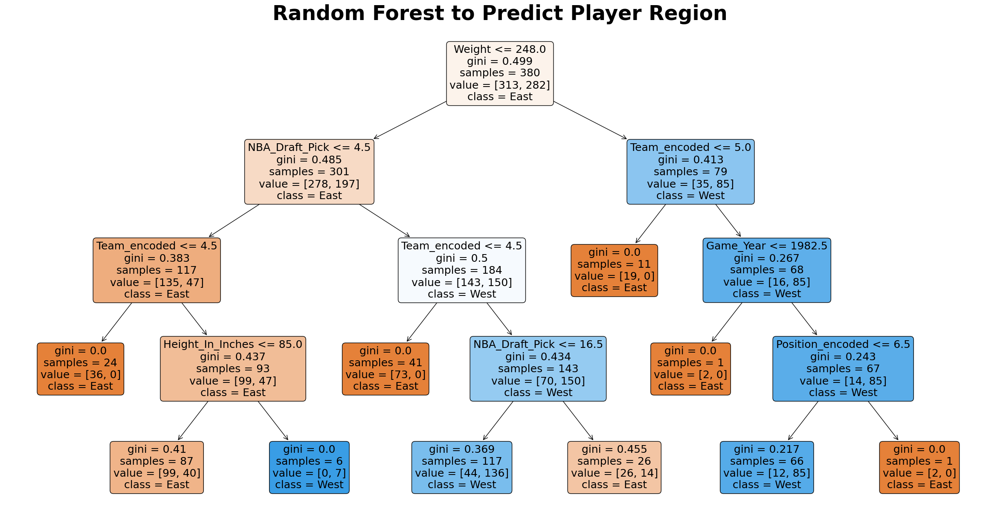

In [719]:
# Random Forest for REGION in Player Details data
X = df2.select_dtypes(include=np.number).drop(['Region_encoded'], axis=1)
y = df2['Region']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=4)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(30,15))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=18)
plt.title("Random Forest to Predict Player Region", fontsize=34, weight='bold')
plt.savefig("../mysite/RF-Details-Region.png")
plt.show()

Accuracy:  0.65
Classification Report:
              precision    recall  f1-score   support

        East       0.64      0.74      0.68        76
        West       0.67      0.56      0.61        73

    accuracy                           0.65       149
   macro avg       0.65      0.65      0.65       149
weighted avg       0.65      0.65      0.65       149



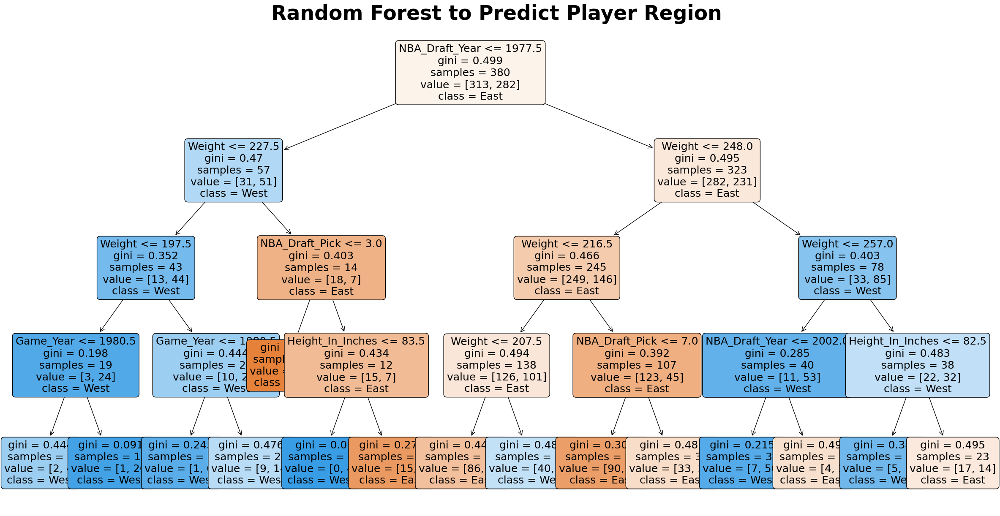

In [720]:
# Random Forest for REGION in Player Details data
X = df2.select_dtypes(include=np.number).drop(['Region_encoded', 'Team_encoded', 'Selection_Type_encoded', 'Position_encoded'], axis=1)
y = df2['Region']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=4)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy: .2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

tree1 = rf_model.estimators_[0]
plt.figure(figsize=(30,15))
plot_tree(tree1, feature_names=X.columns, class_names=y.unique(), filled=True, rounded=True, fontsize=18)
plt.title("Random Forest to Predict Player Region", fontsize=34, weight='bold')
#plt.savefig("../mysite/RF-Details-Region.png")
plt.show()